<a href="https://colab.research.google.com/github/Tashanam-Shahbaz/CGPA-Prediction/blob/main/CS_19022_ML_CEP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <center> CGPA Pediction - Data Preprocessing and Visualization </center>


GROUP MEMBERS:
CS-19022     (TASHANAM SHAHBAZ)
CS-19025     (ALEEZAH IKRAM)
CS19049      (WAJAHAT AHMED)

### Import libraries

In [ ]:
!pip install mglearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn import tree
import joblib
import mglearn

### Path to the dataset

In [ ]:
path='/content/The_Grades_Dataset.csv'

### Load data

In [ ]:
dataset = pd.read_csv(path)

### Dataset


In [ ]:
dataset.head()

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,B-,D+,C-,C,C-,D+,D,C-,B-,...,C-,C-,C-,C-,A-,A,C-,B,A-,2.205
1,CS-97002,A,D,D+,D,B-,C,D,A,D+,...,D+,D,C,D,A-,B-,C,C,B,2.008
2,CS-97003,A,B,A,B-,B+,A,B-,B+,A-,...,B,B,A,C,A,A,A,A-,A,3.608
3,CS-97004,D,C+,D+,D,D,A-,D+,C-,D,...,D+,C,D+,C-,B-,B,C+,C+,C+,1.906
4,CS-97005,A-,A-,A-,B+,A,A,A-,B+,A,...,B-,B+,B+,B-,A-,A,A-,A-,A,3.448


## <center> Visualization and Preprocess Data </center>

### Describe data

In [ ]:
#Diescribtion of CGPA Column only.
dataset.describe()

,CGPA
count,571.000000
mean,2.954888
std,0.620552
min,0.800000
25%,2.538000
50%,3.029000
75%,3.451000
max,3.985000


### Columns

In [ ]:
dataset.columns


Index(['Seat No.', 'PH-121', 'HS-101', 'CY-105', 'HS-105/12', 'MT-111',
       'CS-105', 'CS-106', 'EL-102', 'EE-119', 'ME-107', 'CS-107', 'HS-205/20',
       'MT-222', 'EE-222', 'MT-224', 'CS-210', 'CS-211', 'CS-203', 'CS-214',
       'EE-217', 'CS-212', 'CS-215', 'MT-331', 'EF-303', 'HS-304', 'CS-301',
       'CS-302', 'TC-383', 'MT-442', 'EL-332', 'CS-318', 'CS-306', 'CS-312',
       'CS-317', 'CS-403', 'CS-421', 'CS-406', 'CS-414', 'CS-419', 'CS-423',
       'CS-412', 'CGPA'],
      dtype='object')

### Data type of each column

In [ ]:
dataset.dtypes

Seat No.      object
PH-121        object
HS-101        object
CY-105        object
HS-105/12     object
MT-111        object
CS-105        object
CS-106        object
EL-102        object
EE-119        object
ME-107        object
CS-107        object
HS-205/20     object
MT-222        object
EE-222        object
MT-224        object
CS-210        object
CS-211        object
CS-203        object
CS-214        object
EE-217        object
CS-212        object
CS-215        object
MT-331        object
EF-303        object
HS-304        object
CS-301        object
CS-302        object
TC-383        object
MT-442        object
EL-332        object
CS-318        object
CS-306        object
CS-312        object
CS-317        object
CS-403        object
CS-421        object
CS-406        object
CS-414        object
CS-419        object
CS-423        object
CS-412        object
CGPA         float64
dtype: object

### Number of missing values

In [ ]:
column_names = dataset.columns
for column in column_names:
    print(column + ' - ' + str(dataset[column].isnull().sum()))


Seat No. - 0
PH-121 - 0
HS-101 - 0
CY-105 - 1
HS-105/12 - 1
MT-111 - 2
CS-105 - 0
CS-106 - 2
EL-102 - 2
EE-119 - 2
ME-107 - 2
CS-107 - 2
HS-205/20 - 5
MT-222 - 5
EE-222 - 7
MT-224 - 7
CS-210 - 7
CS-211 - 5
CS-203 - 5
CS-214 - 6
EE-217 - 6
CS-212 - 6
CS-215 - 6
MT-331 - 9
EF-303 - 10
HS-304 - 10
CS-301 - 10
CS-302 - 10
TC-383 - 10
MT-442 - 10
EL-332 - 9
CS-318 - 9
CS-306 - 9
CS-312 - 10
CS-317 - 12
CS-403 - 12
CS-421 - 12
CS-406 - 85
CS-414 - 13
CS-419 - 13
CS-423 - 14
CS-412 - 79
CGPA - 0


### Insights
- 'CGPA' is the target column/variable.
- 'Seat No' doesn't contribute to the target variable 'CGPA'. So, we can remove it from the data.
- As there are a lot of missing values in the columns 'CS-412' and 'CS-406', we can remove it from the data.
- 'PH-121' , 'HS-101' , 'CS-105' , 'CGPA' doesn't have any missing values. 
- Other Columns has less number of missing value. We have to impute them using different techniques.

### Visualization of  Features columns

In [ ]:
len(dataset.columns)

43

These bar chats show average of students getting grades in respective subjects.

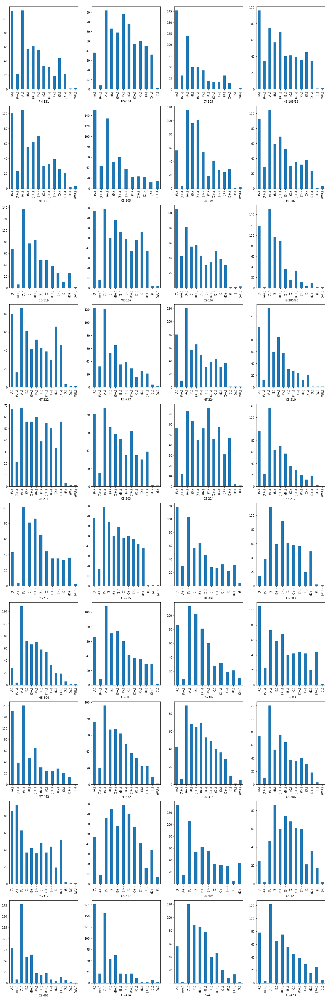

In [ ]:
plt.figure(figsize=(20,70))
for i in range(1,len(dataset.columns)-2):
    plt.subplot(11,4,i)
    dataset[[dataset.columns[i]]].value_counts().sort_index().plot(kind='bar', title=" ")


### Map Catagorial Data to numerical values.
#### Ordinal Encoding

| Grade | Grade Point| Encoded Number |
| --- | --- | --- |  
| A+ | 4.0 |  11|
| A | 4.0 |  11|
| A- | 3.7 |  10|
| B+ | 3.4 |  9|
| B | 3.0 |  8|
| B- | 2.7 |  7|
| C+ | 2.4 |  6|
| C | 2.0 |  5|
| C- | 1.7 |  4|
| D+ | 1.4 |  3|
| D | 1.0 |  2|
| F | 0.0 |  0|
| P | - |  1|
| IP | - |  0|
| X | - |  0|
| I | - |  0|
| W | - |  0|
| WU | - |  0|




In [ ]:
dataset= dataset.replace({'A+':11, 'A':11, 'A-':10, 'B+':9, 'B':8, 'B-':7, 'C+':6, 'C':5, 'C-':4, 'D+':3, 'D':2, 'F':0, 'P':1, 'IP':0, 'X':0, 'I':0, 'W':0, 'WU':0})


In [ ]:
dataset.head()

,Seat No.,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,...,CS-312,CS-317,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412,CGPA
0,CS-97001,7,3,4.0,5.0,4.0,3,2.0,4.0,7.0,...,4.0,4.0,4.0,4.0,10.0,11.0,4.0,8.0,10.0,2.205
1,CS-97002,11,2,3.0,2.0,7.0,5,2.0,11.0,3.0,...,3.0,2.0,5.0,2.0,10.0,7.0,5.0,5.0,8.0,2.008
2,CS-97003,11,8,11.0,7.0,9.0,11,7.0,9.0,10.0,...,8.0,8.0,11.0,5.0,11.0,11.0,11.0,10.0,11.0,3.608
3,CS-97004,2,6,3.0,2.0,2.0,10,3.0,4.0,2.0,...,3.0,5.0,3.0,4.0,7.0,8.0,6.0,6.0,6.0,1.906
4,CS-97005,10,10,10.0,9.0,11.0,11,10.0,9.0,11.0,...,7.0,9.0,9.0,7.0,10.0,11.0,10.0,10.0,11.0,3.448


### Correlation between columns

In [ ]:
corr_matrix = dataset.corr()

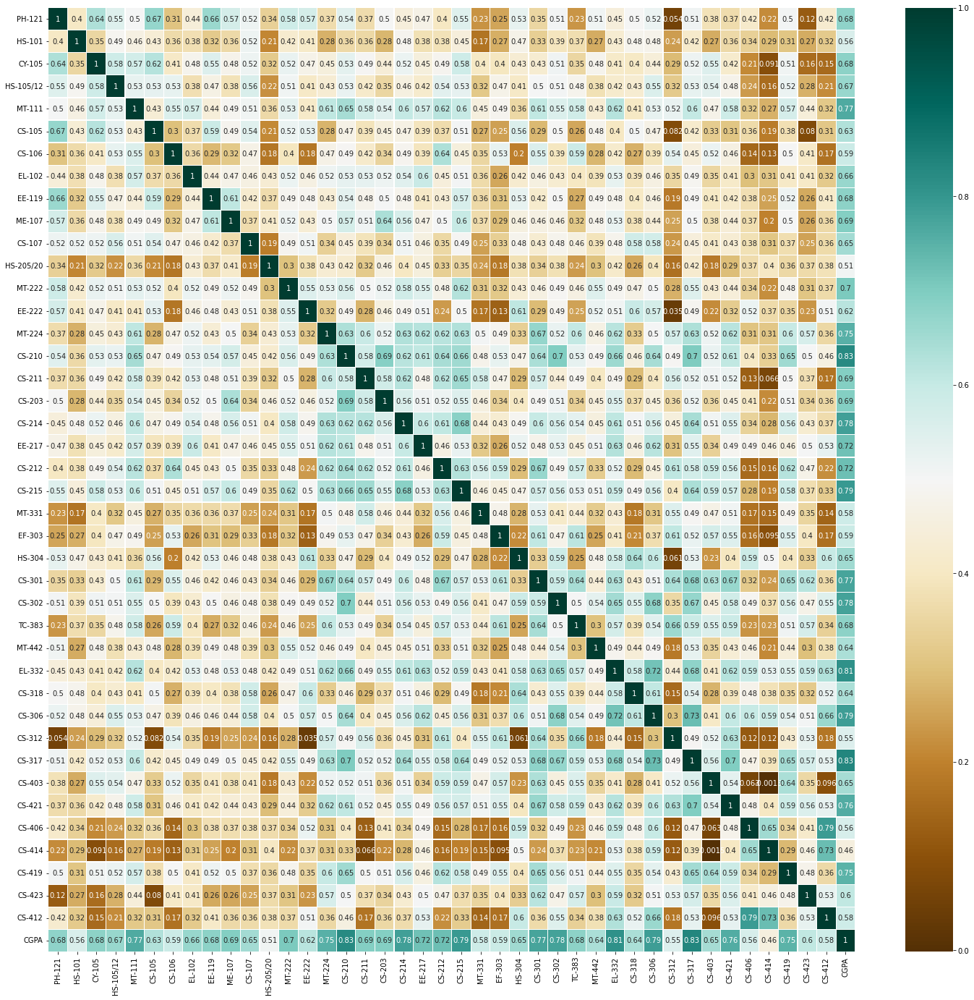

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(25, 24))
sns.heatmap(data = corr_matrix,cmap='BrBG', annot=True, linewidths=0.2)

- We know that every subject from defferent year are marked seperately, advances courses are not included previous related course marks.
- Thats why there is no positive or negative *high* correlations amoung courses.

## Handling missing values


In [ ]:
dataset.columns

Index(['Seat No.', 'PH-121', 'HS-101', 'CY-105', 'HS-105/12', 'MT-111',
       'CS-105', 'CS-106', 'EL-102', 'EE-119', 'ME-107', 'CS-107', 'HS-205/20',
       'MT-222', 'EE-222', 'MT-224', 'CS-210', 'CS-211', 'CS-203', 'CS-214',
       'EE-217', 'CS-212', 'CS-215', 'MT-331', 'EF-303', 'HS-304', 'CS-301',
       'CS-302', 'TC-383', 'MT-442', 'EL-332', 'CS-318', 'CS-306', 'CS-312',
       'CS-317', 'CS-403', 'CS-421', 'CS-406', 'CS-414', 'CS-419', 'CS-423',
       'CS-412', 'CGPA'],
      dtype='object')

In [ ]:
First_year_course=dataset.iloc[:,1:12]
Second_year_course=dataset.iloc[:,12:23]
Third_year_course=dataset[['MT-331','EF-303','HS-304','CS-301','CS-302','TC-383','EL-332','CS-318','CS-306','CS-312','CS-317']]
final_year_course=dataset[['MT-442','CS-403','CS-421','CS-406','CS-414','CS-419','CS-423','CS-412']]

#### First Year Data

In [ ]:
First_year_course

,PH-121,HS-101,CY-105,HS-105/12,MT-111,CS-105,CS-106,EL-102,EE-119,ME-107,CS-107
0,7,3,4.0,5.0,4.0,3,2.0,4.0,7.0,4.0,4.0
1,11,2,3.0,2.0,7.0,5,2.0,11.0,3.0,2.0,9.0
2,11,8,11.0,7.0,9.0,11,7.0,9.0,10.0,10.0,7.0
3,2,6,3.0,2.0,2.0,10,3.0,4.0,2.0,6.0,2.0
4,10,10,10.0,9.0,11.0,11,10.0,9.0,11.0,10.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...
566,8,11,11.0,10.0,11.0,11,10.0,10.0,11.0,9.0,11.0
567,11,11,11.0,11.0,11.0,11,11.0,10.0,11.0,11.0,11.0
568,8,11,10.0,9.0,11.0,11,11.0,11.0,11.0,8.0,11.0
569,11,9,2.0,11.0,2.0,3,7.0,4.0,7.0,4.0,11.0


#### Second Year Dataset

In [ ]:
Second_year_course

,HS-205/20,MT-222,EE-222,MT-224,CS-210,CS-211,CS-203,CS-214,EE-217,CS-212,CS-215
0,9.0,2.0,10.0,7.0,6.0,3.0,3.0,2.0,11.0,2.0,4.0
1,6.0,7.0,4.0,3.0,3.0,2.0,5.0,2.0,7.0,5.0,2.0
2,10.0,11.0,11.0,11.0,11.0,11.0,11.0,10.0,11.0,10.0,11.0
3,8.0,3.0,7.0,2.0,5.0,9.0,6.0,2.0,3.0,2.0,2.0
4,11.0,11.0,10.0,10.0,10.0,7.0,11.0,10.0,11.0,10.0,10.0
...,...,...,...,...,...,...,...,...,...,...,...
566,11.0,11.0,11.0,11.0,11.0,11.0,11.0,11.0,11.0,8.0,10.0
567,9.0,6.0,10.0,8.0,11.0,11.0,11.0,11.0,11.0,11.0,8.0
568,7.0,8.0,9.0,8.0,10.0,11.0,9.0,8.0,11.0,9.0,8.0
569,6.0,2.0,2.0,8.0,7.0,8.0,7.0,5.0,7.0,3.0,3.0


#### Third Year Dataset

In [ ]:
Third_year_course

,MT-331,EF-303,HS-304,CS-301,CS-302,TC-383,EL-332,CS-318,CS-306,CS-312,CS-317
0,5.0,4.0,6.0,8.0,5.0,6.0,5.0,4.0,5.0,4.0,4.0
1,3.0,2.0,4.0,10.0,3.0,4.0,5.0,10.0,2.0,3.0,2.0
2,11.0,6.0,11.0,9.0,10.0,8.0,9.0,10.0,10.0,8.0,8.0
3,3.0,2.0,7.0,2.0,7.0,3.0,3.0,9.0,4.0,3.0,5.0
4,6.0,4.0,10.0,7.0,10.0,6.0,10.0,7.0,10.0,7.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...
566,11.0,8.0,10.0,10.0,11.0,11.0,11.0,11.0,9.0,10.0,10.0
567,11.0,11.0,11.0,11.0,11.0,11.0,11.0,11.0,10.0,9.0,9.0
568,11.0,8.0,7.0,9.0,9.0,11.0,8.0,6.0,9.0,10.0,8.0
569,6.0,2.0,5.0,5.0,6.0,4.0,2.0,7.0,9.0,2.0,8.0


#### Final Year Dataset

In [ ]:
final_year_course

,MT-442,CS-403,CS-421,CS-406,CS-414,CS-419,CS-423,CS-412
0,9.0,4.0,4.0,10.0,11.0,4.0,8.0,10.0
1,4.0,5.0,2.0,10.0,7.0,5.0,5.0,8.0
2,11.0,11.0,5.0,11.0,11.0,11.0,10.0,11.0
3,4.0,3.0,4.0,7.0,8.0,6.0,6.0,6.0
4,10.0,9.0,7.0,10.0,11.0,10.0,10.0,11.0
...,...,...,...,...,...,...,...,...
566,11.0,11.0,11.0,11.0,9.0,9.0,8.0,11.0
567,11.0,11.0,11.0,10.0,8.0,10.0,5.0,10.0
568,9.0,11.0,9.0,11.0,5.0,9.0,10.0,10.0
569,4.0,8.0,4.0,2.0,5.0,8.0,7.0,5.0


In [ ]:
First_year_course.isnull().sum()

PH-121       0
HS-101       0
CY-105       1
HS-105/12    1
MT-111       2
CS-105       0
CS-106       2
EL-102       2
EE-119       2
ME-107       2
CS-107       2
dtype: int64

##### First Year Dataset Representation

Data representation after applying encoding technique
.

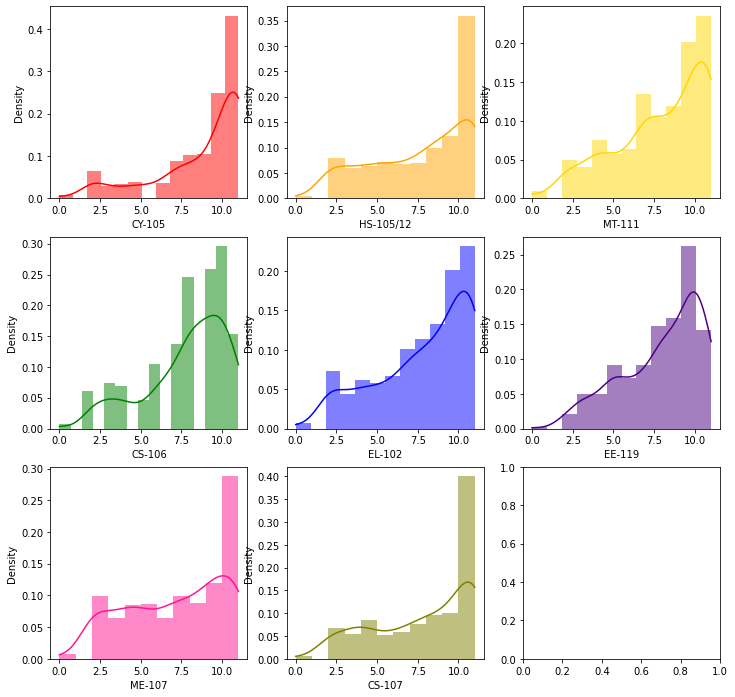

In [ ]:

fig, axes = plt.subplots(3, 3,figsize=(12,12))
sns.histplot(First_year_course['CY-105'],color="red",ax=axes[0,0],kde=True, stat="density", linewidth=0)
sns.histplot(First_year_course['HS-105/12'],color="orange",ax=axes[0,1],kde=True, stat="density", linewidth=0)
sns.histplot(First_year_course['MT-111'],color='gold',ax=axes[0,2],kde=True, stat="density", linewidth=0)
sns.histplot(First_year_course['CS-106'],color="green",ax=axes[1,0],kde=True, stat="density", linewidth=0)
sns.histplot(First_year_course['EL-102'],color="blue",ax=axes[1,1],kde=True, stat="density", linewidth=0)
sns.histplot(First_year_course['EE-119'],color='indigo',ax=axes[1,2],kde=True, stat="density", linewidth=0)
sns.histplot(First_year_course['ME-107'],color="deeppink",ax=axes[2,0],kde=True, stat="density", linewidth=0)
sns.histplot(First_year_course['CS-107'],color="olive",ax=axes[2,1],kde=True, stat="density", linewidth=0)


    

##### Second Year Dataset Representation

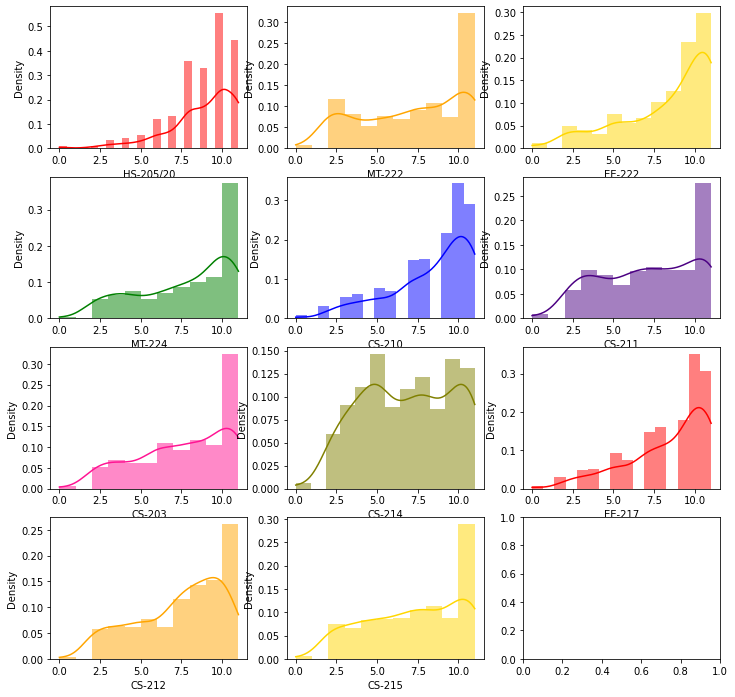

In [ ]:
ig, axes = plt.subplots(4, 3,figsize=(12,12))
sns.histplot(Second_year_course['HS-205/20'],color="red",ax=axes[0,0],kde=True, stat="density", linewidth=0)
sns.histplot(Second_year_course['MT-222'],color="orange",ax=axes[0,1],kde=True, stat="density", linewidth=0)
sns.histplot(Second_year_course['EE-222'],color='gold',ax=axes[0,2],kde=True, stat="density", linewidth=0)
sns.histplot(Second_year_course['MT-224'],color="green",ax=axes[1,0],kde=True, stat="density", linewidth=0)
sns.histplot(Second_year_course['CS-210'],color="blue",ax=axes[1,1],kde=True, stat="density", linewidth=0)
sns.histplot(Second_year_course['CS-211'],color='indigo',ax=axes[1,2],kde=True, stat="density", linewidth=0)
sns.histplot(Second_year_course['CS-203'],color="deeppink",ax=axes[2,0],kde=True, stat="density", linewidth=0)
sns.histplot(Second_year_course['CS-214'],color="olive",ax=axes[2,1],kde=True, stat="density", linewidth=0)
sns.histplot(Second_year_course['EE-217'],color="red",ax=axes[2,2],kde=True, stat="density", linewidth=0)
sns.histplot(Second_year_course['CS-212'],color="orange",ax=axes[3,0],kde=True, stat="density", linewidth=0)
sns.histplot(Second_year_course['CS-215'],color='gold',ax=axes[3,1],kde=True, stat="density", linewidth=0)

##### Third Year Dataset Representation

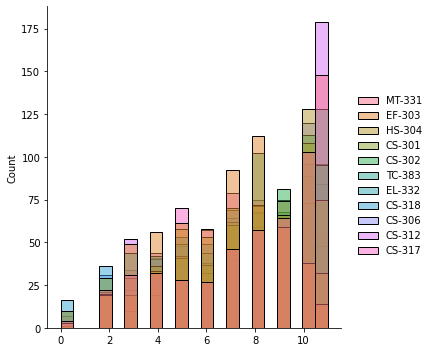

In [ ]:
sns.displot(Third_year_course)

##### Final Year Data Representation

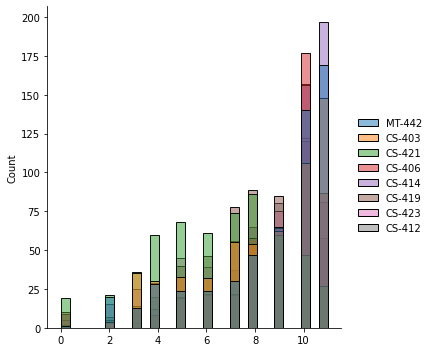

In [ ]:
sns.displot(final_year_course)

#### Impute all Coulmns of all Years Courses with it's majority class.
- At First place, given data is catagorial.
- Second, Dataset has a skewed(very little).
- Thats why filling missing data with mode is the best option.

In [ ]:
First_year_course["CY-105"]=First_year_course["CY-105"].fillna(First_year_course["CY-105"].mode()[0])
First_year_course["HS-105/12"]=First_year_course["HS-105/12"].fillna(First_year_course["HS-105/12"].mode()[0])
First_year_course["MT-111"]=First_year_course["MT-111"].fillna(First_year_course["MT-111"].mode()[0])
First_year_course["CS-106"]=First_year_course["CS-106"].fillna(First_year_course["CS-106"].mode()[0])
First_year_course["EL-102"]=First_year_course["EL-102"].fillna(First_year_course["EL-102"].mode()[0])
First_year_course["EE-119"]=First_year_course["EE-119"].fillna(First_year_course["EE-119"].mode()[0])
First_year_course["ME-107"]=First_year_course["ME-107"].fillna(First_year_course["ME-107"].mode()[0])
First_year_course["CS-107"]=First_year_course["CS-107"].fillna(First_year_course["CS-107"].mode()[0])

In [ ]:
First_year_course.isnull().sum()

PH-121       0
HS-101       0
CY-105       0
HS-105/12    0
MT-111       0
CS-105       0
CS-106       0
EL-102       0
EE-119       0
ME-107       0
CS-107       0
dtype: int64

In [ ]:
Second_year_course["HS-205/20"]=Second_year_course["HS-205/20"].fillna(Second_year_course["HS-205/20"].mode()[0])
Second_year_course["MT-222"]=Second_year_course["MT-222"].fillna(Second_year_course["MT-222"].mode()[0])
Second_year_course["EE-222"]=Second_year_course["EE-222"].fillna(Second_year_course["EE-222"].mode()[0])
Second_year_course["MT-224"]=Second_year_course["MT-224"].fillna(Second_year_course["MT-224"].mode()[0])
Second_year_course["CS-210"]=Second_year_course["CS-210"].fillna(Second_year_course["CS-210"].mode()[0])
Second_year_course["CS-211"]=Second_year_course["CS-211"].fillna(Second_year_course["CS-211"].mode()[0])
Second_year_course["CS-203"]=Second_year_course["CS-203"].fillna(Second_year_course["CS-203"].mode()[0])
Second_year_course["CS-214"]=Second_year_course["CS-214"].fillna(Second_year_course["CS-214"].mode()[0])
Second_year_course["CS-203"]=Second_year_course["CS-203"].fillna(Second_year_course["CS-203"].mode()[0])
Second_year_course["CS-214"]=Second_year_course["CS-214"].fillna(Second_year_course["CS-214"].mode()[0])
Second_year_course["EE-217"]=Second_year_course["EE-217"].fillna(Second_year_course["EE-217"].mode()[0])
Second_year_course["CS-212"]=Second_year_course["CS-212"].fillna(Second_year_course["CS-212"].mode()[0])
Second_year_course["CS-215"]=Second_year_course["CS-215"].fillna(Second_year_course["CS-215"].mode()[0])

In [ ]:
Second_year_course.isnull().sum()

HS-205/20    0
MT-222       0
EE-222       0
MT-224       0
CS-210       0
CS-211       0
CS-203       0
CS-214       0
EE-217       0
CS-212       0
CS-215       0
dtype: int64

In [ ]:
Third_year_course['MT-331']=Third_year_course['MT-331'].fillna(Third_year_course['MT-331'].mode()[0])
Third_year_course['EF-303']=Third_year_course['EF-303'].fillna(Third_year_course['EF-303'].mode()[0])
Third_year_course['HS-304']=Third_year_course['HS-304'].fillna(Third_year_course['HS-304'].mode()[0])
Third_year_course['TC-383']=Third_year_course['TC-383'].fillna(Third_year_course['TC-383'].mode()[0])
Third_year_course['EL-332']=Third_year_course['EL-332'].fillna(Third_year_course['EL-332'].mode()[0])
Third_year_course['CS-318']=Third_year_course['CS-318'].fillna(Third_year_course['CS-318'].mode()[0])
Third_year_course['CS-306']=Third_year_course['CS-306'].fillna(Third_year_course['CS-306'].mode()[0])
Third_year_course['CS-312']=Third_year_course['CS-312'].fillna(Third_year_course['CS-312'].mode()[0])
Third_year_course['CS-317']=Third_year_course['CS-317'].fillna(Third_year_course['CS-317'].mode()[0])
Third_year_course['CS-301']=Third_year_course['CS-301'].fillna(Third_year_course['CS-301'].mode()[0])
Third_year_course['CS-302']=Third_year_course['CS-302'].fillna(Third_year_course['CS-302'].mode()[0])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

In [ ]:
Third_year_course.isnull().sum()

MT-331    0
EF-303    0
HS-304    0
CS-301    0
CS-302    0
TC-383    0
EL-332    0
CS-318    0
CS-306    0
CS-312    0
CS-317    0
dtype: int64

- In CS-406 and CS-412 there are 85 and 79 students are absent which is quit a big number. 
- Droping these two coulmns from dataset

In [ ]:
final_year_course.isnull().sum()

MT-442    10
CS-403    12
CS-421    12
CS-406    85
CS-414    13
CS-419    13
CS-423    14
CS-412    79
dtype: int64

In [ ]:
final_year_course=final_year_course.drop(['CS-406','CS-412'],axis=1)

In [ ]:
final_year_course['MT-442']=final_year_course['MT-442'].fillna(final_year_course['MT-442'].mode()[0])
final_year_course['CS-403']=final_year_course['CS-403'].fillna(final_year_course['CS-403'].mode()[0])
final_year_course['CS-421']=final_year_course['CS-421'].fillna(final_year_course['CS-421'].mode()[0])
final_year_course['CS-414']=final_year_course['CS-414'].fillna(final_year_course['CS-414'].mode()[0])
final_year_course['CS-419']=final_year_course['CS-419'].fillna(final_year_course['CS-419'].mode()[0])
final_year_course['CS-423']=final_year_course['CS-423'].fillna(final_year_course['CS-423'].mode()[0])

In [ ]:
final_year_course.isnull().sum()

MT-442    0
CS-403    0
CS-421    0
CS-414    0
CS-419    0
CS-423    0
dtype: int64

In [ ]:
target=dataset['CGPA']
target

0      2.205
1      2.008
2      3.608
3      1.906
4      3.448
       ...  
566    3.798
567    3.772
568    3.470
569    2.193
570    1.753
Name: CGPA, Length: 571, dtype: float64

## <center> Models and Predictions </center>

#### Model 1: predict final CGPA based on GPs of first year only.

In [ ]:
from  sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,r2_score,mean_squared_error
from sklearn import tree


In [ ]:
mx1_train,mx1_test,my1_train,my1_test=train_test_split(First_year_course,target,test_size=0.2)

##### a. Decision Tree

In [ ]:
model_1_a=DecisionTreeRegressor(max_depth=3).fit(mx1_train,my1_train)

In [ ]:
prediction_1_a=model_1_a.predict(mx1_test)

In [ ]:
## R2 SCORE

r2_score(my1_test,prediction_1_a)

0.3833398868587222

In [ ]:
# R2 ADJUSTED SCORE
Adj_r2 = 1 - (1-r2_score(my1_test, prediction_1_a)) * (len(my1_train)-1)/(len(my1_train)-mx1_train.shape[1]-1)
Adj_r2


0.3680622714430599

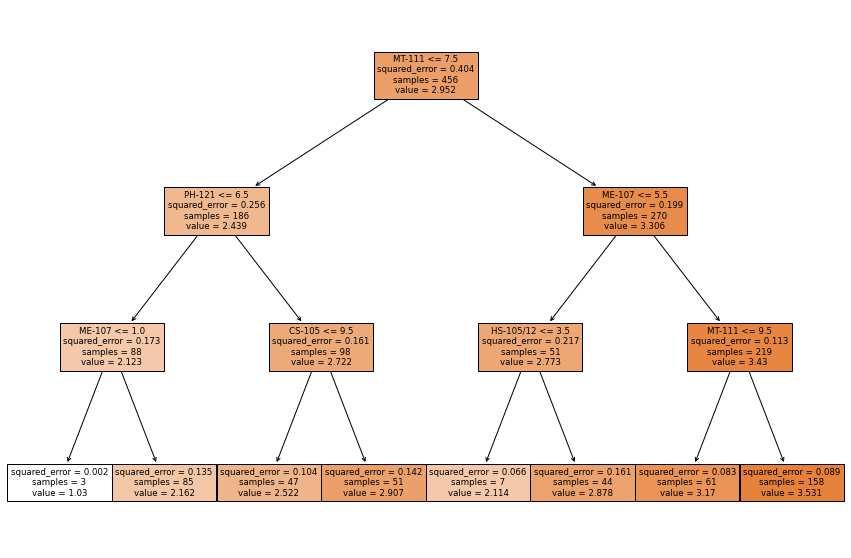

In [ ]:
fig = plt.figure(figsize=(15,10))
_ = tree.plot_tree(model_1_a, feature_names=First_year_course.columns, filled=True)

In [ ]:
## Save to file in a current working directory
joblib.dump(model_1_a,"desision_tree.pkl")


['desision_tree.pkl']

##### b. Linear Regression

In [ ]:
model_1_b=LinearRegression().fit(mx1_train,my1_train)


In [ ]:
prediction_1_b=model_1_b.predict(mx1_test)

In [ ]:
# The coefficients
print("1. Coefficients: \n", model_1_b.coef_)
# The coefficients
print("2. Coefficients: ", model_1_b.intercept_)
# The mean squared error
print("3. Mean squared error: %.2f" % mean_squared_error(my1_test, prediction_1_b))
# The coefficient of determination: 1 is perfect prediction
print("4. R Square Score: %.2f" % r2_score(my1_test, prediction_1_b))
# R adjusted Squre
Adj_r2 = 1 - (1-r2_score(my1_test, prediction_1_b)) * (len(my1_train)-1)/(len(my1_train)-mx1_train.shape[1]-1)
print("5. R Adjusted Square Score %.2f" % Adj_r2 )


1. Coefficients: 
 [0.00677785 0.01683486 0.00546523 0.02284046 0.0518865  0.01788836
 0.02868266 0.03111603 0.0413972  0.04321374 0.01591728]
2. Coefficients:  0.7717780517315398
3. Mean squared error: 0.09
4. R Square Score: 0.72
5. R Adjusted Square Score 0.71


In [ ]:
fig, axes = plt.subplots(4, 3,figsize=(20,20))
j=0
k=0
for i in First_year_course.columns:
    if j==4:
        break
    sns.regplot(x=i, y=target, data=First_year_course,ax=axes[j,k]).set(title=f'Regression plot of {i} and CGPA')
    k+=1
    if k==3:
        j+=1
        k=0


In [ ]:
joblib.dump(model_1_b,"linear_regression.pkl")

#### Model 2: predict final CGPA based on GPs of first two years.

In [ ]:
## Adding Course of First year in Second Year
combined_2=pd.concat([First_year_course,Second_year_course],axis=1)

In [ ]:
combined_2.columns

In [ ]:
mx2_train,mx2_test,my2_train,my2_test=train_test_split(combined_2,target,test_size=0.2)

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor


##### a. KNeighborsRegressor

In [ ]:
model_2_a=KNeighborsRegressor().fit(mx2_train,my2_train)

In [ ]:
prediction_2_a=model_2_a.predict(mx2_test)

In [ ]:
r2_score(my2_test,prediction_2_a)

In [ ]:
joblib.dump(model_2_a,"KNeighborsRegressor.pkl")

In [ ]:
plt.plot(my2_test, model_2_a.predict(mx2_test))
plt.plot(mx2_train,my2_train, '^', c=mglearn.cm2(0),   markersize=8)
plt.plot(mx2_test,my2_test, 'v', c=mglearn.cm2(1), markersize=8)
plt.title("{} neighbor(s)\n train score: {:.2f} test  score: {:.2f}".format(5,    model_2_a.score(mx2_train, my2_train),model_2_a.score(mx2_test, my2_test)))
plt.xlabel("Feature")
plt.ylabel("Target")
plt.legend(["Model predictions", "Training data/target","Test   data/target"], loc="best")

##### b. RandomForestRegressor

In [ ]:
model_2_b=RandomForestRegressor().fit(mx2_train,my2_train)

In [ ]:
prediction_2_b=model_2_b.predict(mx2_test)

In [ ]:
r2_score(my2_test,prediction_2_b)

In [ ]:
joblib.dump(model_2_b,"RandomForestRegressor.pkl")

In [ ]:
estimator = model_2_b.estimators_[5]

In [ ]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, 
                out_file='tree.dot', 
                feature_names = combined_2.columns,
                class_names = target,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

In [ ]:
# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

In [ ]:
# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

#### Model 3: predict final CGPA based on GPs of all years.

In [ ]:
combined_3=pd.concat([First_year_course,Second_year_course,Third_year_course,final_year_course],axis=1)

In [ ]:
combined_3.columns

Index(['PH-121', 'HS-101', 'CY-105', 'HS-105/12', 'MT-111', 'CS-105', 'CS-106',
       'EL-102', 'EE-119', 'ME-107', 'CS-107', 'HS-205/20', 'MT-222', 'EE-222',
       'MT-224', 'CS-210', 'CS-211', 'CS-203', 'CS-214', 'EE-217', 'CS-212',
       'CS-215', 'MT-331', 'EF-303', 'HS-304', 'CS-301', 'CS-302', 'TC-383',
       'EL-332', 'CS-318', 'CS-306', 'CS-312', 'CS-317', 'MT-442', 'CS-403',
       'CS-421', 'CS-414', 'CS-419', 'CS-423'],
      dtype='object')

In [ ]:
mx3_train,mx3_test,my3_train,my3_test=train_test_split(combined_3,target,test_size=0.2)

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import  Dense
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingRegressor

##### a.  Feed Forward Neural Networks using TensorFlow

In [ ]:
model_3_a = keras.Sequential([
        Dense(20, activation=tf.nn.swish, input_shape=[len(combined_3.columns)]),
        Dense(1)
    ])

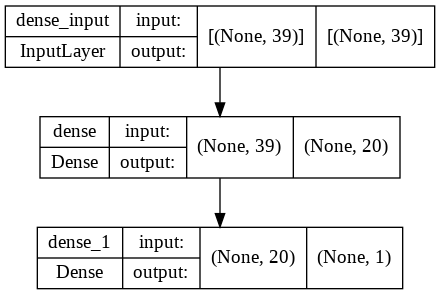

In [ ]:

tf.keras.utils.plot_model(model_3_a, to_file="my_model.png", show_shapes=True)

In [ ]:
model_3_a.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 20)                800       
                                                                 
 dense_1 (Dense)             (None, 1)                 21        
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model_3_a.compile(optimizer='adam',
                  loss='mse',
                  metrics=['mae', 'mse'])

In [ ]:
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=50)

In [ ]:
history = model_3_a.fit(mx3_train, my3_train, epochs=150, verbose=0, validation_split = 0.1,callbacks=[early_stop])

In [ ]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch

rmse_final = np.sqrt(float(hist['val_mse'].tail(1)))
print()
print('Final Root Mean Square Error on validation set: {}'.format(round(rmse_final, 3)))


Final Root Mean Square Error on validation set: 0.293


In [ ]:
hist

,loss,mae,mse,val_loss,val_mae,val_mse,epoch
0,6.846332,2.025612,6.846332,6.266706,2.172964,6.266706,0
1,3.530023,1.481904,3.530023,2.469751,1.172728,2.469751,1
2,2.222142,1.166190,2.222142,2.258684,1.242739,2.258684,2
3,1.877531,1.057009,1.877531,1.808946,1.049601,1.808946,3
4,1.747316,1.012274,1.747316,1.677274,1.024187,1.677274,4
...,...,...,...,...,...,...,...
145,0.010807,0.080454,0.010807,0.084787,0.157332,0.084787,145
146,0.009978,0.078314,0.009978,0.094565,0.160052,0.094565,146
147,0.008446,0.069048,0.008446,0.086806,0.146221,0.086806,147
148,0.008176,0.068652,0.008176,0.088564,0.150103,0.088564,148


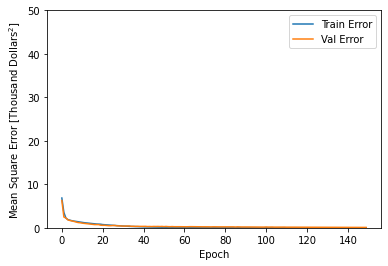

In [ ]:
def plot_history():
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Square Error [Thousand Dollars$^2$]')
    plt.plot(hist['epoch'], hist['mse'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mse'], label = 'Val Error')
    plt.legend()
    plt.ylim([0,50])

plot_history()

In [ ]:

mse, _, _ = model_3_a.evaluate(mx3_test, my3_test)
rmse = np.sqrt(mse)
print('Root Mean Square Error on test set: {}'.format(round(rmse, 3)))

4/4 [==============================] - 0s 3ms/step - loss: 0.0780 - mae: 0.1328 - mse: 0.0780
Root Mean Square Error on test set: 0.279


In [ ]:
prediction_3_a=model_3_a.predict(mx3_test)

In [ ]:
r2_score(prediction_3_a,my3_test)

0.7509906661246452

In [ ]:
joblib.dump(model_3_a,"FFNN.pkl")

INFO:tensorflow:Assets written to: ram://ec8244b2-8bc7-430e-84d4-22e111ff510a/assets


['FFNN.pkl']

##### b. GradientBoostingRegressor

In [ ]:

model_3_b = GradientBoostingRegressor().fit(mx3_train,my3_train)

In [ ]:
predictions_3_b = model_3_b.predict(mx3_test)

In [ ]:
r2_score(predictions_3_b,my3_test)

0.8275262641156943

In [ ]:
joblib.dump(model_3_b,"GradientBoostingRegressor.pkl")

['GradientBoostingRegressor.pkl']

In [ ]:
paras=model_3_b.get_params()

In [ ]:
sc = StandardScaler()
mx3_test_std = sc.fit_transform(mx3_test)

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  "X does not have valid feature names, but"


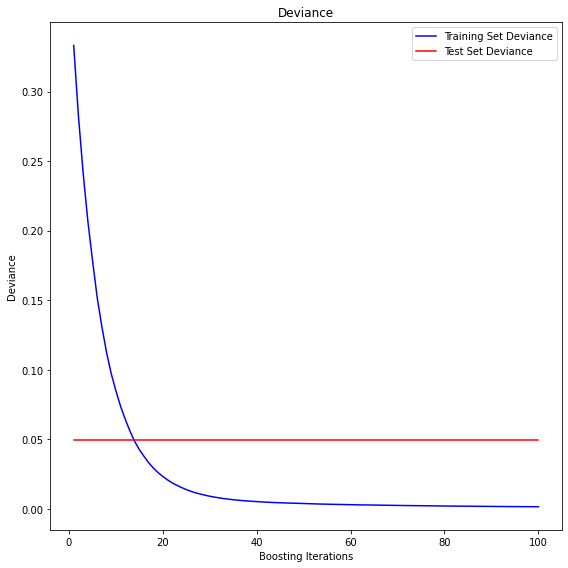

In [ ]:
test_score = np.zeros((paras['n_estimators'],), dtype=np.float64)
for i, y_pred in enumerate(model_3_b.staged_predict(mx3_test_std)):
    test_score[i] = model_3_b.loss_(my3_test, predictions_3_b)
 
fig = plt.figure(figsize=(8, 8))
plt.subplot(1, 1, 1)
plt.title('Deviance')
plt.plot(np.arange(paras['n_estimators']) + 1, model_3_b.train_score_, 'b-',
         label='Training Set Deviance')
plt.plot(np.arange(paras['n_estimators']) + 1, test_score, 'r-',
         label='Test Set Deviance')
plt.legend(loc='upper right')
plt.xlabel('Boosting Iterations')
plt.ylabel('Deviance')
fig.tight_layout()
plt.show()

# USER INTERFACE 

Deployed Link

https://cgpa-prediction-3.herokuapp.com/